In [1]:
import torch

import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.preprocessing import MinMaxScaler
from pandas.plotting import register_matplotlib_converters
from torch import nn, optim

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#93D30C", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 14, 10
register_matplotlib_converters()

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

# Analysis on dataset: total-and-daily-cases-covid-19

In [2]:
covid_df = pd.read_csv('total-and-daily-cases-covid-19.csv')

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [4]:
covid_df

,Entity,Code,Date,Total confirmed cases (cases),Daily new confirmed cases (cases)
0,Afghanistan,AFG,"Dec 31, 2019",0,0
1,Afghanistan,AFG,"Jan 1, 2020",0,0
2,Afghanistan,AFG,"Jan 2, 2020",0,0
3,Afghanistan,AFG,"Jan 3, 2020",0,0
4,Afghanistan,AFG,"Jan 4, 2020",0,0
5,Afghanistan,AFG,"Jan 5, 2020",0,0
6,Afghanistan,AFG,"Jan 6, 2020",0,0
7,Afghanistan,AFG,"Jan 7, 2020",0,0
8,Afghanistan,AFG,"Jan 8, 2020",0,0
9,Afghanistan,AFG,"Jan 9, 2020",0,0


In [5]:
india_df = covid_df.loc[covid_df['Entity'] == 'India']

In [6]:
india_df

,Entity,Code,Date,Total confirmed cases (cases),Daily new confirmed cases (cases)
9312,India,IND,"Dec 31, 2019",0,0
9313,India,IND,"Jan 1, 2020",0,0
9314,India,IND,"Jan 2, 2020",0,0
9315,India,IND,"Jan 3, 2020",0,0
9316,India,IND,"Jan 4, 2020",0,0
9317,India,IND,"Jan 5, 2020",0,0
9318,India,IND,"Jan 6, 2020",0,0
9319,India,IND,"Jan 7, 2020",0,0
9320,India,IND,"Jan 8, 2020",0,0
9321,India,IND,"Jan 9, 2020",0,0


In [7]:
daily_cases = india_df[['Date']].copy()
daily_cases['Cases'] = india_df['Daily new confirmed cases (cases)']
daily_cases

,Date,Cases
9312,"Dec 31, 2019",0
9313,"Jan 1, 2020",0
9314,"Jan 2, 2020",0
9315,"Jan 3, 2020",0
9316,"Jan 4, 2020",0
9317,"Jan 5, 2020",0
9318,"Jan 6, 2020",0
9319,"Jan 7, 2020",0
9320,"Jan 8, 2020",0
9321,"Jan 9, 2020",0


In [8]:
daily_cases.index = pd.to_datetime(daily_cases.Date)
daily_cases = daily_cases.drop(columns = 'Date')

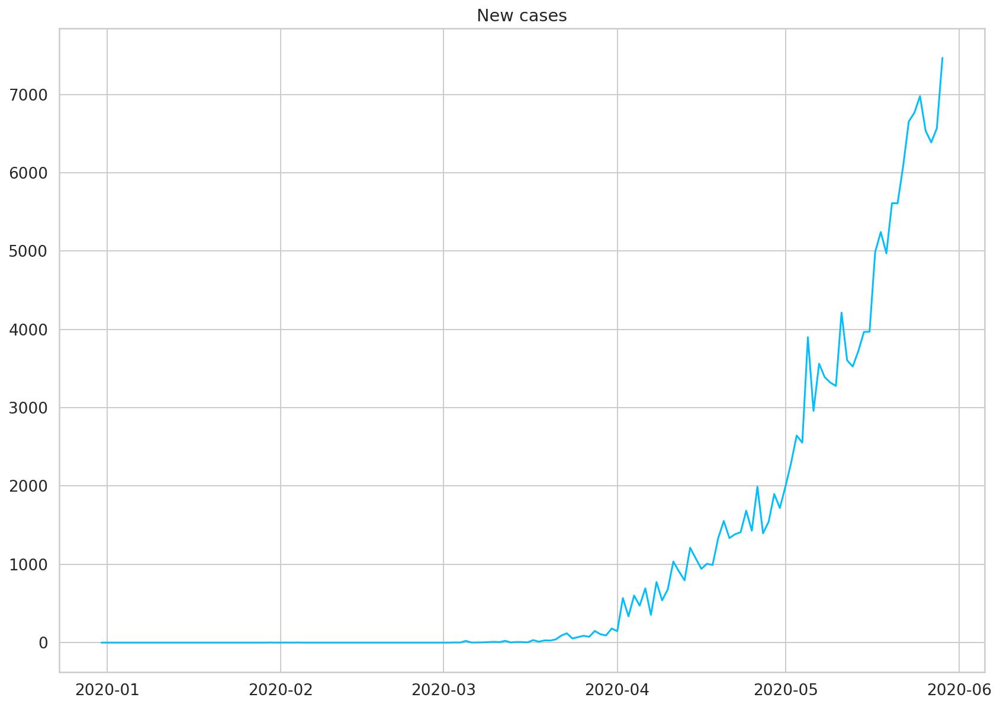

In [9]:
plt.plot(daily_cases)
plt.title("New cases");

In [10]:
total_cases = india_df[['Date']].copy()
total_cases['Cases'] = india_df['Total confirmed cases (cases)']
total_cases

,Date,Cases
9312,"Dec 31, 2019",0
9313,"Jan 1, 2020",0
9314,"Jan 2, 2020",0
9315,"Jan 3, 2020",0
9316,"Jan 4, 2020",0
9317,"Jan 5, 2020",0
9318,"Jan 6, 2020",0
9319,"Jan 7, 2020",0
9320,"Jan 8, 2020",0
9321,"Jan 9, 2020",0


In [11]:
total_cases.index = pd.to_datetime(total_cases.Date)
total_cases = total_cases.drop(columns = 'Date')
total_cases

,Cases
Date,
2019-12-31,0
2020-01-01,0
2020-01-02,0
2020-01-03,0
2020-01-04,0
2020-01-05,0
2020-01-06,0
2020-01-07,0
2020-01-08,0


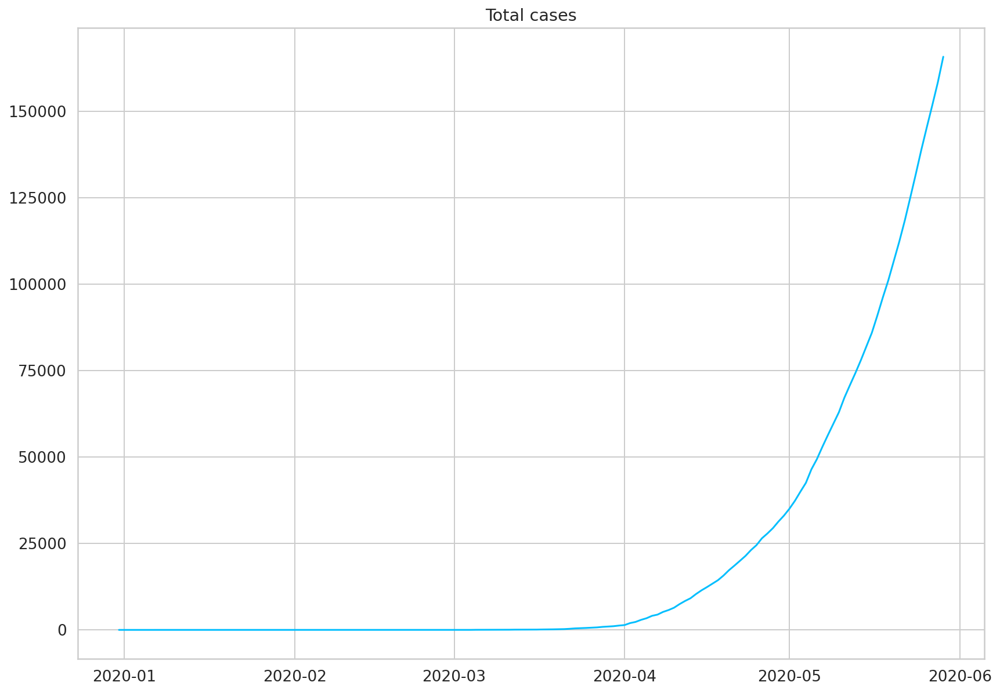

In [12]:
plt.plot(total_cases)
plt.title("Total cases");

# Training and testing data - to check the performance of the model

# Splitting data into training and testing sets

In [13]:
test_data_size = 10

train_data = daily_cases[20:-test_data_size]
test_data = daily_cases[-test_data_size:]

print("train data shape = "+str(train_data.shape))
print("test data shape = "+str(test_data.shape))

train data shape = (120, 1)
test data shape = (10, 1)


## Scaling the data using min_max_scaler for better performance on model

In [14]:
scaler = MinMaxScaler()

scaler = scaler.fit(train_data)

train_data = scaler.transform(train_data)

test_data = scaler.transform(test_data)

In [15]:
def create_sequences(data, seq_length):
    xs = []
    ys = []

    for i in range(len(data)-seq_length-1):
        x = data[i:(i+seq_length)]
        y = data[i+seq_length]
        xs.append(x)
        ys.append(y)

    return np.array(xs), np.array(ys)

In [16]:
seq_length = 5
X_train, y_train = create_sequences(train_data, seq_length)
X_test, y_test = create_sequences(test_data, seq_length)

X_train = torch.from_numpy(X_train).float()
y_train = torch.from_numpy(y_train).float()

X_test = torch.from_numpy(X_test).float()
y_test = torch.from_numpy(y_test).float()

In [17]:
X_train.shape

torch.Size([114, 5, 1])

In [18]:
X_train[50:]

tensor([[[1.1446e-03],
         [4.3876e-03],
         [3.8153e-04],
         [1.5261e-03],
         [1.3354e-03]],

        [[4.3876e-03],
         [3.8153e-04],
         [1.5261e-03],
         [1.3354e-03],
         [5.7230e-04]],

        [[3.8153e-04],
         [1.5261e-03],
         [1.3354e-03],
         [5.7230e-04],
         [6.1045e-03]],

        [[1.5261e-03],
         [1.3354e-03],
         [5.7230e-04],
         [6.1045e-03],
         [2.2892e-03]],

        [[1.3354e-03],
         [5.7230e-04],
         [6.1045e-03],
         [2.2892e-03],
         [5.3415e-03]],

        [[5.7230e-04],
         [6.1045e-03],
         [2.2892e-03],
         [5.3415e-03],
         [4.9599e-03]],

        [[6.1045e-03],
         [2.2892e-03],
         [5.3415e-03],
         [4.9599e-03],
         [7.6307e-03]],

        [[2.2892e-03],
         [5.3415e-03],
         [4.9599e-03],
         [7.6307e-03],
         [1.6978e-02]],

        [[5.3415e-03],
         [4.9599e-03],
         [7.6307e-

In [19]:
y_train.shape

torch.Size([114, 1])

## Model

In [20]:
class CoronaVirusPredictor(nn.Module):

  def __init__(self, n_features, n_hidden, seq_len, n_layers=2):
    super(CoronaVirusPredictor, self).__init__()

    self.n_hidden = n_hidden
    self.seq_len = seq_len
    self.n_layers = n_layers

    self.lstm = nn.LSTM(
      input_size=n_features,
      hidden_size=n_hidden,
      num_layers=n_layers,
      dropout=0.5
    )

    self.linear = nn.Linear(in_features=n_hidden, out_features=1)

  def reset_hidden_state(self):
    self.hidden = (
        torch.zeros(self.n_layers, self.seq_len, self.n_hidden),
        torch.zeros(self.n_layers, self.seq_len, self.n_hidden)
    )

  def forward(self, sequences):
    lstm_out, self.hidden = self.lstm(
      sequences.view(len(sequences), self.seq_len, -1),
      self.hidden
    )
    last_time_step = \
      lstm_out.view(self.seq_len, len(sequences), self.n_hidden)[-1]
    y_pred = self.linear(last_time_step)
    return y_pred

Constructor - initialize all helper data and create the layers
reset_hidden_state - we'll use a stateless LSTM, so we need to reset the state after each example
forward - get the sequences, pass all of them through the LSTM layer, at once. We take the output of the last time step and pass it through our linear layer to get the prediction.

In [21]:
def train_model(
  model, 
  train_data, 
  train_labels, 
  test_data=None, 
  test_labels=None
):
  loss_fn = torch.nn.MSELoss(reduction='sum')

  optimiser = torch.optim.Adam(model.parameters(), lr=1e-3)
  num_epochs = 22

  train_hist = np.zeros(num_epochs)
  test_hist = np.zeros(num_epochs)

  for t in range(num_epochs):
    model.reset_hidden_state()

    y_pred = model(X_train)

    loss = loss_fn(y_pred.float(), y_train)

    if test_data is not None:
      with torch.no_grad():
        y_test_pred = model(X_test)
        test_loss = loss_fn(y_test_pred.float(), y_test)
      test_hist[t] = test_loss.item()

      if t % 10 == 0:  
        print(f'Epoch {t} train loss: {loss.item()} test loss: {test_loss.item()}')
    elif t % 10 == 0:
      print(f'Epoch {t} train loss: {loss.item()}')

    train_hist[t] = loss.item()
    
    optimiser.zero_grad()

    loss.backward()

    optimiser.step()
  
  return model.eval(), train_hist, test_hist

In [22]:
model = CoronaVirusPredictor(
  n_features=1, 
  n_hidden=512, 
  seq_len=seq_length, 
  n_layers=2
)
model, train_hist, test_hist = train_model(
  model, 
  X_train, 
  y_train, 
  X_test, 
  y_test
)

Epoch 0 train loss: 9.445560455322266 test loss: 6.245387077331543
Epoch 10 train loss: 5.108164310455322 test loss: 2.6706929206848145
Epoch 20 train loss: 2.3905527591705322 test loss: 1.0292332172393799


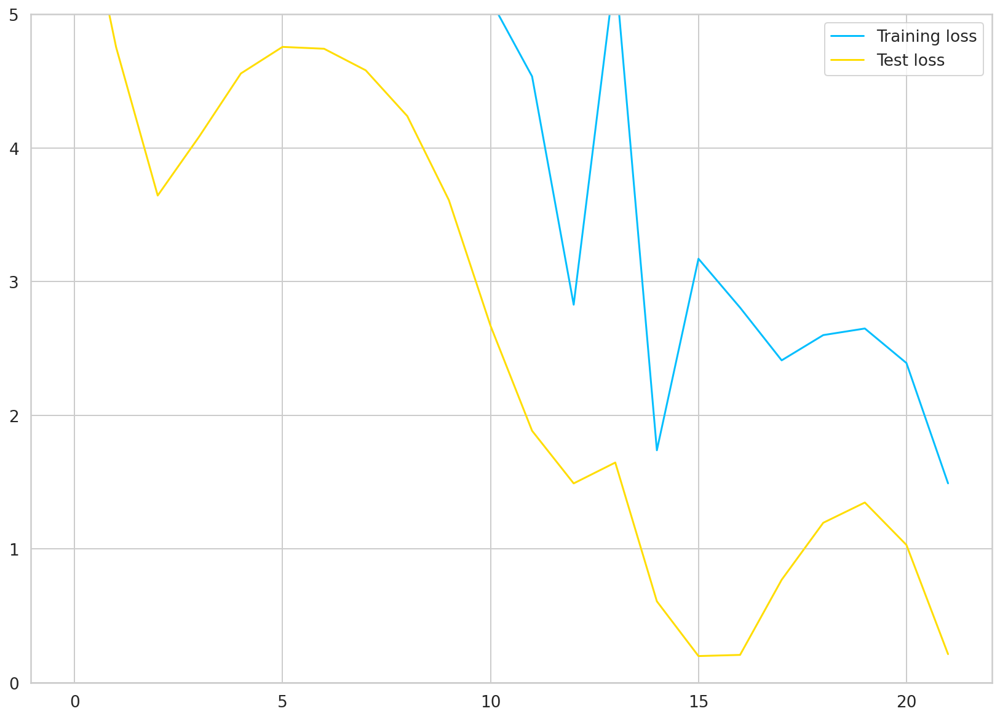

In [23]:
plt.plot(train_hist, label="Training loss")
plt.plot(test_hist, label="Test loss")
plt.ylim((0, 5))
plt.legend();

### model can (due to the way we've trained it) predict only a single day in the future. We'll employ a simple strategy to overcome this limitation. Use predicted values as input for predicting the next days:

In [24]:
with torch.no_grad():
  test_seq = X_test[:1]
  preds = []
  for _ in range(len(X_test)):
    y_test_pred = model(test_seq)
    pred = torch.flatten(y_test_pred).item()
    preds.append(pred)
    new_seq = test_seq.numpy().flatten()
    new_seq = np.append(new_seq, [pred])
    new_seq = new_seq[1:]
    test_seq = torch.as_tensor(new_seq).view(1, seq_length, 1).float()

In [25]:
true_cases = scaler.inverse_transform(
    np.expand_dims(y_test.flatten().numpy(), axis=0)
).flatten()

predicted_cases = scaler.inverse_transform(
  np.expand_dims(preds, axis=0)
).flatten()

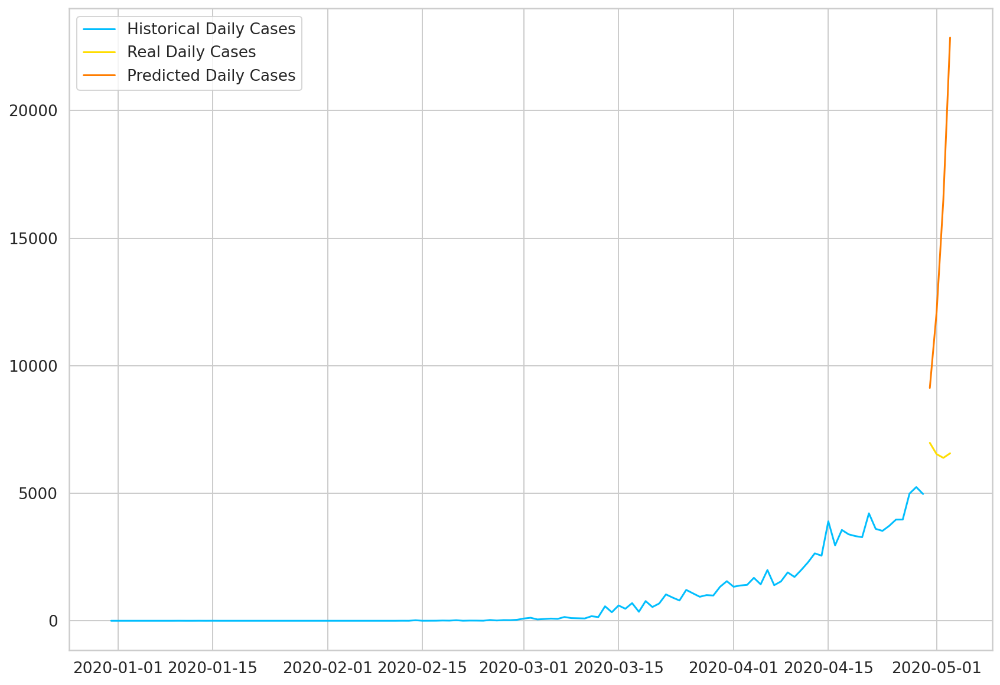

In [26]:
plt.plot(
  daily_cases.index[:len(train_data)], 
  scaler.inverse_transform(train_data).flatten(),
  label='Historical Daily Cases'
)

plt.plot(
  daily_cases.index[len(train_data):len(train_data) + len(true_cases)], 
  true_cases,
  label='Real Daily Cases'
)

plt.plot(
  daily_cases.index[len(train_data):len(train_data) + len(true_cases)], 
  predicted_cases, 
  label='Predicted Daily Cases'
)

plt.legend();

# we will now use all the data for training the same model

In [27]:
#store = daily_cases
#daily_cases = daily_cases.iloc[-10:,:]
total_cases

,Cases
Date,
2019-12-31,0
2020-01-01,0
2020-01-02,0
2020-01-03,0
2020-01-04,0
2020-01-05,0
2020-01-06,0
2020-01-07,0
2020-01-08,0


In [28]:
scaler = MinMaxScaler()

scaler = scaler.fit(daily_cases)

all_data = scaler.transform(daily_cases)

all_data.shape

(150, 1)

In [29]:
all_data

array([[0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [1.33940530e-04],
       [0.00000000e+00],
       [0.00000000e+00],
       [1.33940530e-04],
       [0.00000000e+00],
       [1.33940530e-04],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],


In [30]:
X_all, y_all = create_sequences(all_data, seq_length)

X_all = torch.from_numpy(X_all).float()
y_all = torch.from_numpy(y_all).float()

In [31]:
model = CoronaVirusPredictor(
  n_features=1, 
  n_hidden=512, 
  seq_len=seq_length, 
  n_layers=2
)
model, train_hist, _ = train_model(model, X_all, y_all)

Epoch 0 train loss: 8.543228149414062
Epoch 10 train loss: 5.559932708740234
Epoch 20 train loss: 2.520721197128296


In [32]:
DAYS_TO_PREDICT = 5

with torch.no_grad():
  test_seq = X_all[:1]
  preds = []
  for _ in range(DAYS_TO_PREDICT):
    y_test_pred = model(test_seq)
    pred = torch.flatten(y_test_pred).item()
    preds.append(pred)
    new_seq = test_seq.numpy().flatten()
    new_seq = np.append(new_seq, [pred])
    new_seq = new_seq[1:]
    test_seq = torch.as_tensor(new_seq).view(1, seq_length, 1).float()

In [33]:
predicted_cases = scaler.inverse_transform(
  np.expand_dims(preds, axis=0)
).flatten()

In [34]:
daily_cases.index[-1]

Timestamp('2020-05-29 00:00:00')

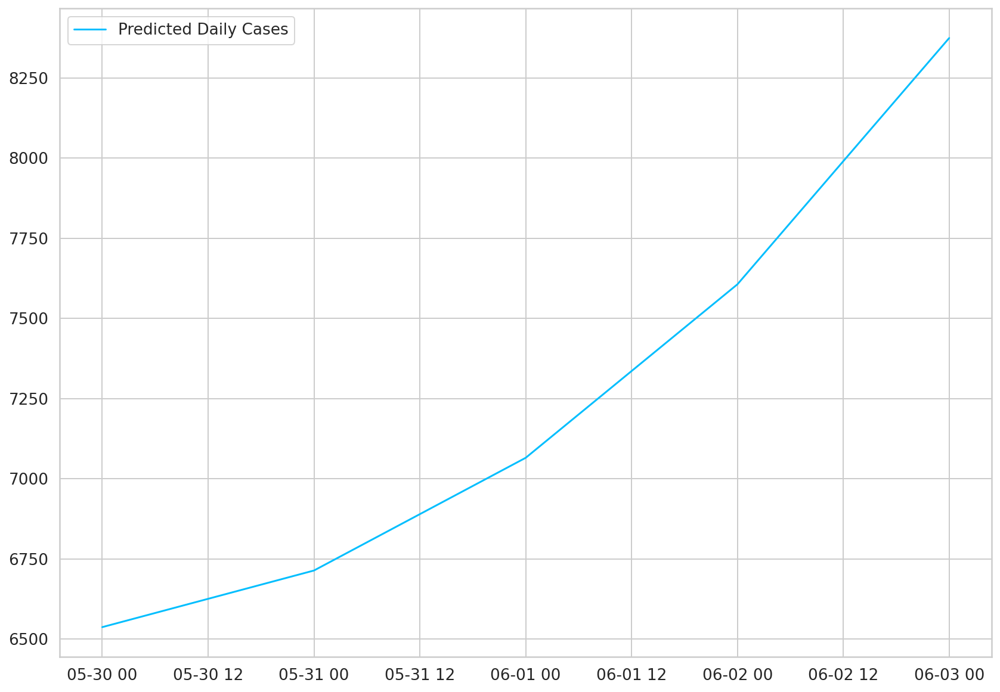

In [35]:
predicted_index = pd.date_range(
  start=daily_cases.index[-1],
  periods=DAYS_TO_PREDICT + 1,
  closed='right'
)

predicted_cases = pd.Series(
  data=predicted_cases,
  index=predicted_index
)

plt.plot(predicted_cases, label='Predicted Daily Cases')
plt.legend();

In [36]:
predicted_cases

2020-05-30    6537.367406
2020-05-31    6713.912870
2020-06-01    7065.340357
2020-06-02    7606.283520
2020-06-03    8374.064312
Freq: D, dtype: float64

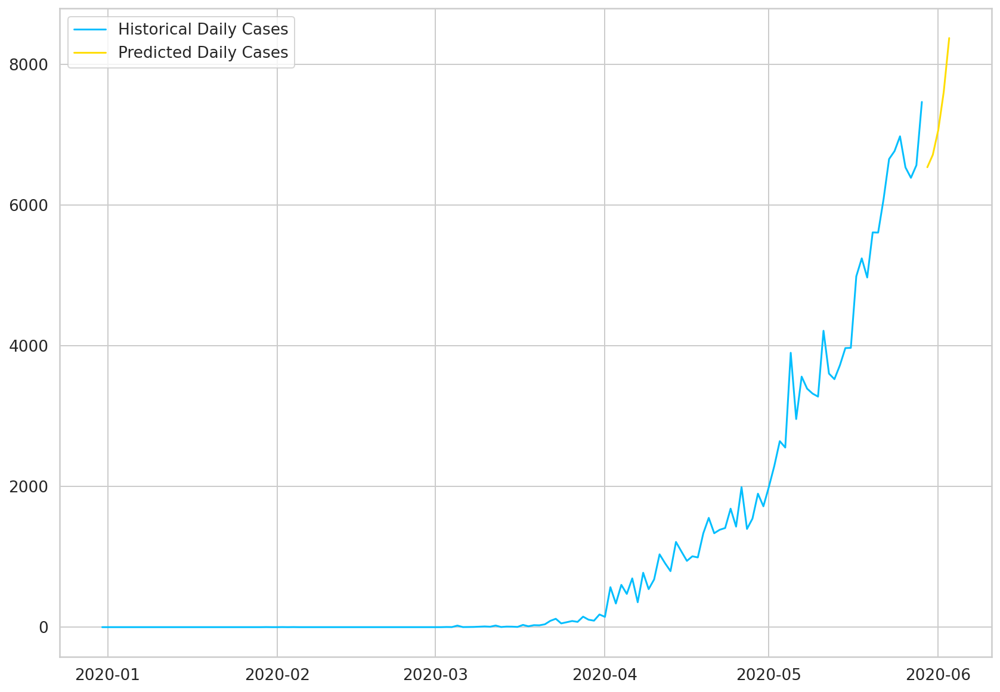

In [37]:
plt.plot(daily_cases, label='Historical Daily Cases')
plt.plot(predicted_cases, label='Predicted Daily Cases')
plt.legend();

In [38]:
total_cases

,Cases
Date,
2019-12-31,0
2020-01-01,0
2020-01-02,0
2020-01-03,0
2020-01-04,0
2020-01-05,0
2020-01-06,0
2020-01-07,0
2020-01-08,0


# Total cases

In [39]:
test_data_size = 10

train_data = total_cases[20:-test_data_size]
test_data = total_cases[-test_data_size:]

print("train data shape = "+str(train_data.shape))
print("test data shape = "+str(test_data.shape))

train data shape = (120, 1)
test data shape = (10, 1)


## Scaling the data using min_max_scaler for better performance on model

In [40]:
scaler = MinMaxScaler()

scaler = scaler.fit(train_data)

train_data = scaler.transform(train_data)

test_data = scaler.transform(test_data)

In [41]:
def create_sequences(data, seq_length):
    xs = []
    ys = []

    for i in range(len(data)-seq_length-1):
        x = data[i:(i+seq_length)]
        y = data[i+seq_length]
        xs.append(x)
        ys.append(y)

    return np.array(xs), np.array(ys)

In [42]:
seq_length = 5
X_train, y_train = create_sequences(train_data, seq_length)
X_test, y_test = create_sequences(test_data, seq_length)

X_train = torch.from_numpy(X_train).float()
y_train = torch.from_numpy(y_train).float()

X_test = torch.from_numpy(X_test).float()
y_test = torch.from_numpy(y_test).float()

In [43]:
X_train.shape

torch.Size([114, 5, 1])

In [44]:
X_train[50:]

tensor([[[4.9437e-04],
         [7.2178e-04],
         [7.4155e-04],
         [8.2065e-04],
         [8.8986e-04]],

        [[7.2178e-04],
         [7.4155e-04],
         [8.2065e-04],
         [8.8986e-04],
         [9.1953e-04]],

        [[7.4155e-04],
         [8.2065e-04],
         [8.8986e-04],
         [9.1953e-04],
         [1.2359e-03]],

        [[8.2065e-04],
         [8.8986e-04],
         [9.1953e-04],
         [1.2359e-03],
         [1.3546e-03]],

        [[8.8986e-04],
         [9.1953e-04],
         [1.2359e-03],
         [1.3546e-03],
         [1.6314e-03]],

        [[9.1953e-04],
         [1.2359e-03],
         [1.3546e-03],
         [1.6314e-03],
         [1.8885e-03]],

        [[1.2359e-03],
         [1.3546e-03],
         [1.6314e-03],
         [1.8885e-03],
         [2.2840e-03]],

        [[1.3546e-03],
         [1.6314e-03],
         [1.8885e-03],
         [2.2840e-03],
         [3.1640e-03]],

        [[1.6314e-03],
         [1.8885e-03],
         [2.2840e-

In [45]:
y_train.shape

torch.Size([114, 1])

In [46]:
y_train

tensor([[0.0000e+00],
        [0.0000e+00],
        [0.0000e+00],
        [0.0000e+00],
        [0.0000e+00],
        [9.8874e-06],
        [9.8874e-06],
        [9.8874e-06],
        [1.9775e-05],
        [1.9775e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [2.9662e-05],
        [4.9437e-05],
        [5.9324e-05],
        [2.7685e-04],
        [2.8673e-04],
        [3.0651e-04],
        [3.3617e-04],
        [4.3504e-04],
        [4

In [47]:
class CoronaVirusPredictor(nn.Module):

  def __init__(self, n_features, n_hidden, seq_len, n_layers=2):
    super(CoronaVirusPredictor, self).__init__()

    self.n_hidden = n_hidden
    self.seq_len = seq_len
    self.n_layers = n_layers

    self.lstm = nn.LSTM(
      input_size=n_features,
      hidden_size=n_hidden,
      num_layers=n_layers,
      dropout=0.5
    )

    self.linear = nn.Linear(in_features=n_hidden, out_features=1)

  def reset_hidden_state(self):
    self.hidden = (
        torch.zeros(self.n_layers, self.seq_len, self.n_hidden),
        torch.zeros(self.n_layers, self.seq_len, self.n_hidden)
    )

  def forward(self, sequences):
    lstm_out, self.hidden = self.lstm(
      sequences.view(len(sequences), self.seq_len, -1),
      self.hidden
    )
    last_time_step = \
      lstm_out.view(self.seq_len, len(sequences), self.n_hidden)[-1]
    y_pred = self.linear(last_time_step)
    return y_pred

Constructor - initialize all helper data and create the layers
reset_hidden_state - we'll use a stateless LSTM, so we need to reset the state after each example
forward - get the sequences, pass all of them through the LSTM layer, at once. We take the output of the last time step and pass it through our linear layer to get the prediction.

In [204]:
def train_model(
  model, 
  train_data, 
  train_labels, 
  test_data=None, 
  test_labels=None
):
  loss_fn = torch.nn.MSELoss(reduction='sum')

  optimiser = torch.optim.Adam(model.parameters(), lr=1e-3)
  num_epochs = 11

  train_hist = np.zeros(num_epochs)
  test_hist = np.zeros(num_epochs)

  for t in range(num_epochs):
    model.reset_hidden_state()

    y_pred = model(X_train)

    loss = loss_fn(y_pred.float(), y_train)

    if test_data is not None:
      with torch.no_grad():
        y_test_pred = model(X_test)
        test_loss = loss_fn(y_test_pred.float(), y_test)
      test_hist[t] = test_loss.item()

      if t % 10 == 0:  
        print(f'Epoch {t} train loss: {loss.item()} test loss: {test_loss.item()}')
    elif t % 10 == 0:
      print(f'Epoch {t} train loss: {loss.item()}')

    train_hist[t] = loss.item()
    
    optimiser.zero_grad()

    loss.backward()

    optimiser.step()
  
  return model.eval(), train_hist, test_hist

In [205]:
model = CoronaVirusPredictor(
  n_features=1, 
  n_hidden=512, 
  seq_len=seq_length, 
  n_layers=2
)
model, train_hist, test_hist = train_model(
  model, 
  X_train, 
  y_train, 
  X_test, 
  y_test
)

Epoch 0 train loss: 7.94743013381958 test loss: 8.451919555664062
Epoch 10 train loss: 3.19459867477417 test loss: 1.7142865657806396


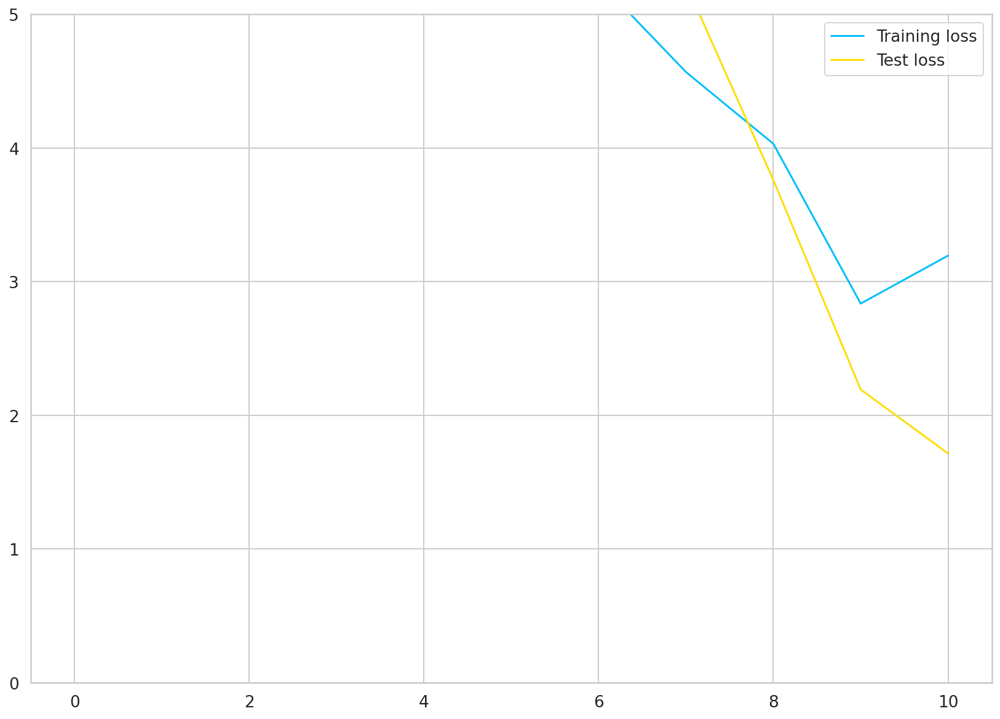

In [206]:
plt.plot(train_hist, label="Training loss")
plt.plot(test_hist, label="Test loss")
plt.ylim((0, 5))
plt.legend();

### model can (due to the way we've trained it) predict only a single day in the future. We'll employ a simple strategy to overcome this limitation. Use predicted values as input for predicting the next days:

In [207]:
with torch.no_grad():
  test_seq = X_test[:1]
  preds = []
  for _ in range(len(X_test)):
    y_test_pred = model(test_seq)
    pred = torch.flatten(y_test_pred).item()
    preds.append(pred)
    new_seq = test_seq.numpy().flatten()
    new_seq = np.append(new_seq, [pred])
    new_seq = new_seq[1:]
    test_seq = torch.as_tensor(new_seq).view(1, seq_length, 1).float()

In [208]:
true_cases = scaler.inverse_transform(
    np.expand_dims(y_test.flatten().numpy(), axis=0)
).flatten()

predicted_cases = scaler.inverse_transform(
  np.expand_dims(preds, axis=0)
).flatten()

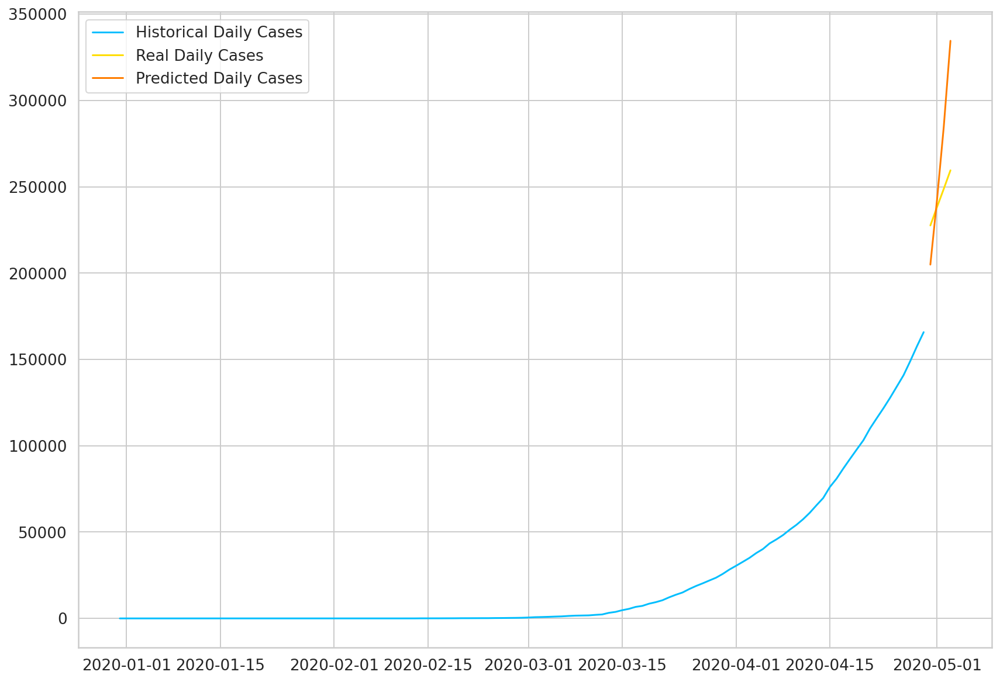

In [209]:
plt.plot(
  daily_cases.index[:len(train_data)], 
  scaler.inverse_transform(train_data).flatten(),
  label='Historical Daily Cases'
)

plt.plot(
  daily_cases.index[len(train_data):len(train_data) + len(true_cases)], 
  true_cases,
  label='Real Daily Cases'
)

plt.plot(
  daily_cases.index[len(train_data):len(train_data) + len(true_cases)], 
  predicted_cases, 
  label='Predicted Daily Cases'
)

plt.legend();

# we will now use all the data for training the same model

In [210]:
scaler = MinMaxScaler()

scaler = scaler.fit(total_cases)

all_data = scaler.transform(total_cases)

all_data.shape

(150, 1)

In [211]:
all_data

array([[0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00],
       [6.03139947e-06],
       [6.03139947e-06],
       [6.03139947e-06],
       [1.20627989e-05],
       [1.20627989e-05],
       [1.80941984e-05],
       [1.80941984e-05],
       [1.80941984e-05],
       [1.80941984e-05],
       [1.80941984e-05],


In [212]:
X_all, y_all = create_sequences(all_data, seq_length)

X_all = torch.from_numpy(X_all).float()
y_all = torch.from_numpy(y_all).float()

In [213]:
model = CoronaVirusPredictor(
  n_features=1, 
  n_hidden=512, 
  seq_len=seq_length, 
  n_layers=2
)
model, train_hist, _ = train_model(model, X_all, y_all)

Epoch 0 train loss: 7.785182476043701
Epoch 10 train loss: 2.2105772495269775


In [214]:
DAYS_TO_PREDICT = 10

with torch.no_grad():
  test_seq = X_all[:1]
  preds = []
  for _ in range(DAYS_TO_PREDICT):
    y_test_pred = model(test_seq)
    pred = torch.flatten(y_test_pred).item()
    preds.append(pred)
    new_seq = test_seq.numpy().flatten()
    new_seq = np.append(new_seq, [pred])
    new_seq = new_seq[1:]
    test_seq = torch.as_tensor(new_seq).view(1, seq_length, 1).float()

In [215]:
predicted_cases = scaler.inverse_transform(
  np.expand_dims(preds, axis=0)
).flatten()

In [216]:
daily_cases.index[-1]

Timestamp('2020-05-29 00:00:00')

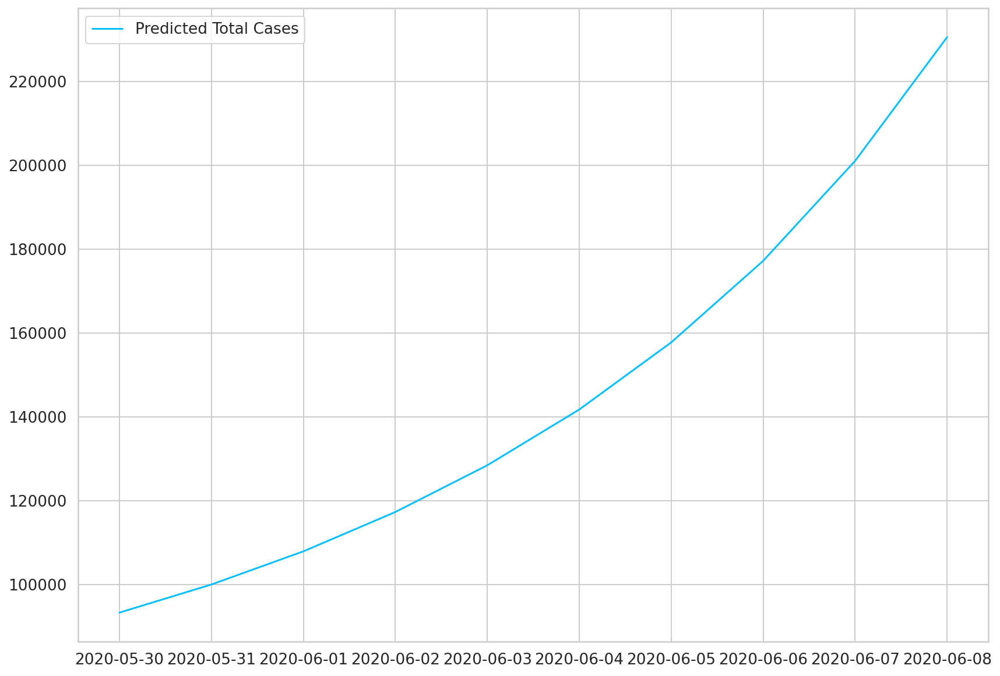

In [217]:
predicted_index = pd.date_range(
  start=daily_cases.index[-1],
  periods=DAYS_TO_PREDICT + 1,
  closed='right'
)

predicted_cases = pd.Series(
  data=predicted_cases,
  index=predicted_index
)

plt.plot(predicted_cases, label='Predicted Total Cases')
plt.legend();

In [218]:
predicted_cases

2020-05-30     93270.930475
2020-05-31     99982.259511
2020-06-01    107886.185550
2020-06-02    117269.406623
2020-06-03    128414.252743
2020-06-04    141718.638365
2020-06-05    157731.144868
2020-06-06    177183.316207
2020-06-07    201036.264272
2020-06-08    230535.041793
Freq: D, dtype: float64

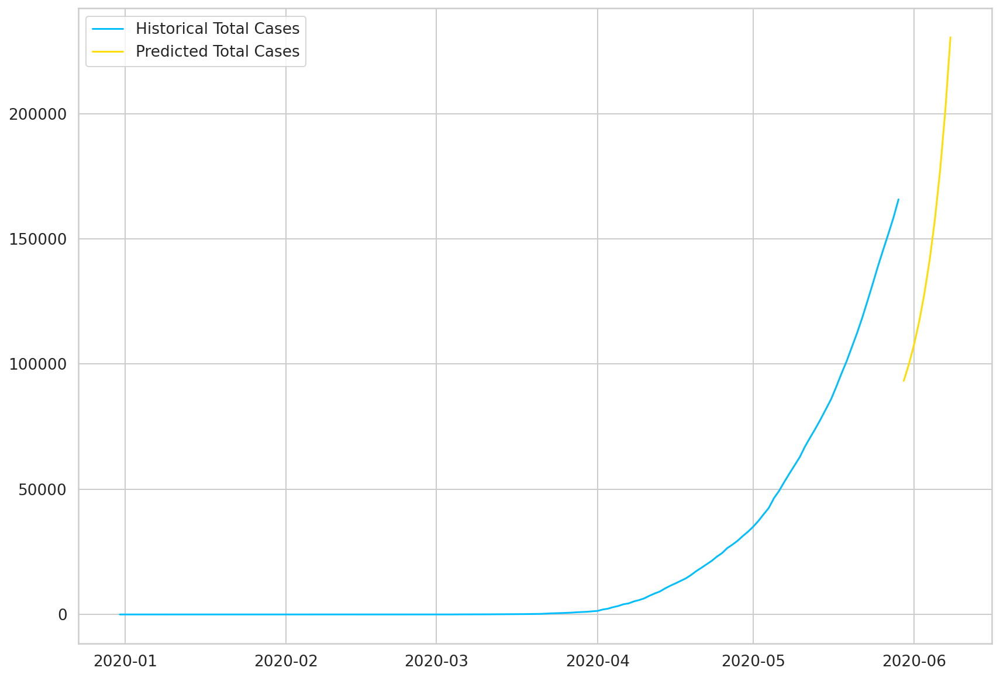

In [220]:
plt.plot(total_cases, label='Historical Total Cases')
plt.plot(predicted_cases, label='Predicted Total Cases')
plt.legend();